<a href="https://colab.research.google.com/github/YasidaWanigatunga/Intellihack_Innovision_2/blob/main/ml_task_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [6]:
import warnings

# Filter out DeprecationWarnings and DataConversionWarnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

**Importing Data**

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [13]:
crop = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/intellihack/Crop_Dataset.csv")
crop.head()

,N,P,K,temperature,humidity,ph,rainfall,Total_Nutrients,Temperature_Humidity,Log_Rainfall,Label,Label_Encoded
0,90,42,43,20.879744,82.002744,6.502985,202.935536,175,1712.196283,5.317804,wheat,0
1,85,58,41,21.770462,80.319644,7.038096,226.655537,184,1748.595734,5.427834,wheat,0
2,60,55,44,23.004459,82.320763,7.840207,263.964248,159,1893.744627,5.579595,wheat,0
3,74,35,40,26.491096,80.158363,6.980401,242.864034,149,2123.482908,5.496611,wheat,0
4,78,42,42,20.130175,81.604873,7.628473,262.717340,162,1642.720357,5.574878,wheat,0


Remove Label column

In [14]:
crop = crop.drop(columns=['Label'])

In [15]:
crop.shape

(2200, 11)

In [16]:
crop.duplicated().sum()

0

In [17]:
crop.isnull().sum()

N                       0
P                       0
K                       0
temperature             0
humidity                0
ph                      0
rainfall                0
Total_Nutrients         0
Temperature_Humidity    0
Log_Rainfall            0
Label_Encoded           0
dtype: int64

In [18]:
crop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2200 entries, 0 to 2199
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   N                     2200 non-null   int64  
 1   P                     2200 non-null   int64  
 2   K                     2200 non-null   int64  
 3   temperature           2200 non-null   float64
 4   humidity              2200 non-null   float64
 5   ph                    2200 non-null   float64
 6   rainfall              2200 non-null   float64
 7   Total_Nutrients       2200 non-null   int64  
 8   Temperature_Humidity  2200 non-null   float64
 9   Log_Rainfall          2200 non-null   float64
 10  Label_Encoded         2200 non-null   int64  
dtypes: float64(6), int64(5)
memory usage: 189.2 KB


In [19]:
crop.describe()

,N,P,K,temperature,humidity,ph,rainfall,Total_Nutrients,Temperature_Humidity,Log_Rainfall,Label_Encoded
count,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000,2200.000000
mean,50.551818,53.362727,48.149091,25.616244,71.481779,6.469480,103.463655,152.063636,1854.231566,4.508730,10.500000
std,36.917334,32.985883,50.647931,5.063749,22.263812,0.773938,54.958389,79.918669,699.366334,0.545400,6.345731
min,0.000000,5.000000,5.000000,8.825675,14.258040,3.504752,20.211267,17.000000,247.613182,3.054533,0.000000
25%,21.000000,28.000000,20.000000,22.769375,60.261953,5.971693,64.551686,94.000000,1479.558114,4.182839,5.000000
50%,37.000000,51.000000,32.000000,25.598693,80.473146,6.425045,94.867624,146.000000,1927.883340,4.562968,10.500000
75%,84.250000,68.000000,49.000000,28.561654,89.948771,6.923643,124.267508,179.000000,2255.752423,4.830451,16.000000
max,140.000000,145.000000,205.000000,43.675493,99.981876,9.935091,298.560117,385.000000,4073.159566,5.702315,21.000000


**EDA**

In [20]:
corr = crop.corr()

In [21]:
corr

,N,P,K,temperature,humidity,ph,rainfall,Total_Nutrients,Temperature_Humidity,Log_Rainfall,Label_Encoded
N,1.000000,-0.231460,-0.140512,0.026504,0.190688,0.096683,0.059020,0.277354,0.171262,-0.022427,0.282787
P,-0.231460,1.000000,0.736232,-0.127541,-0.118734,-0.138019,-0.063839,0.772406,-0.148511,0.020987,-0.167951
K,-0.140512,0.736232,1.000000,-0.160387,0.190859,-0.169503,-0.053461,0.872711,0.071176,-0.010642,0.143703
temperature,0.026504,-0.127541,-0.160387,1.000000,0.205320,-0.017795,-0.030084,-0.142043,0.671088,-0.084825,0.180571
humidity,0.190688,-0.118734,0.190859,0.205320,1.000000,-0.008483,0.094423,0.160035,0.843915,0.011665,0.524452
ph,0.096683,-0.138019,-0.169503,-0.017795,-0.008483,1.000000,-0.109069,-0.119727,0.000939,-0.119933,0.052389
rainfall,0.059020,-0.063839,-0.053461,-0.030084,0.094423,-0.109069,1.000000,-0.032966,0.053436,0.946157,0.121486
Total_Nutrients,0.277354,0.772406,0.872711,-0.142043,0.160035,-0.119727,-0.032966,1.000000,0.062923,-0.008441,0.152380
Temperature_Humidity,0.171262,-0.148511,0.071176,0.671088,0.843915,0.000939,0.053436,0.062923,1.000000,-0.043194,0.482026
Log_Rainfall,-0.022427,0.020987,-0.010642,-0.084825,0.011665,-0.119933,0.946157,-0.008441,-0.043194,1.000000,0.130926


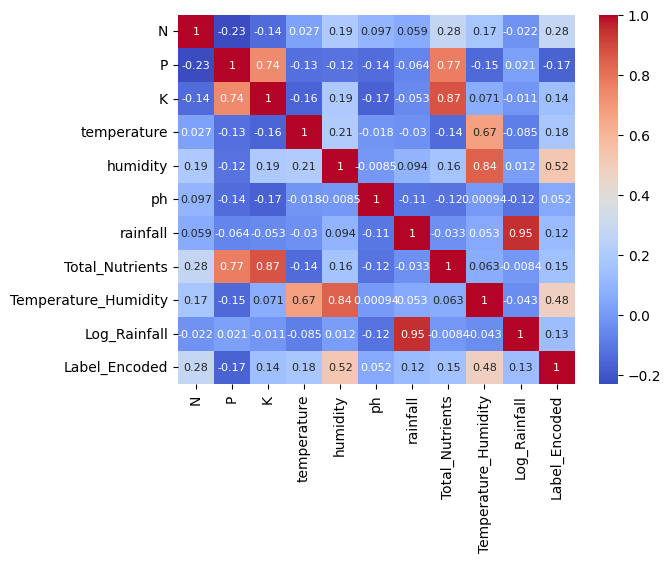

In [22]:
sns.heatmap(corr, annot=True, cbar=True, cmap='coolwarm', annot_kws={"size": 8})
plt.show()

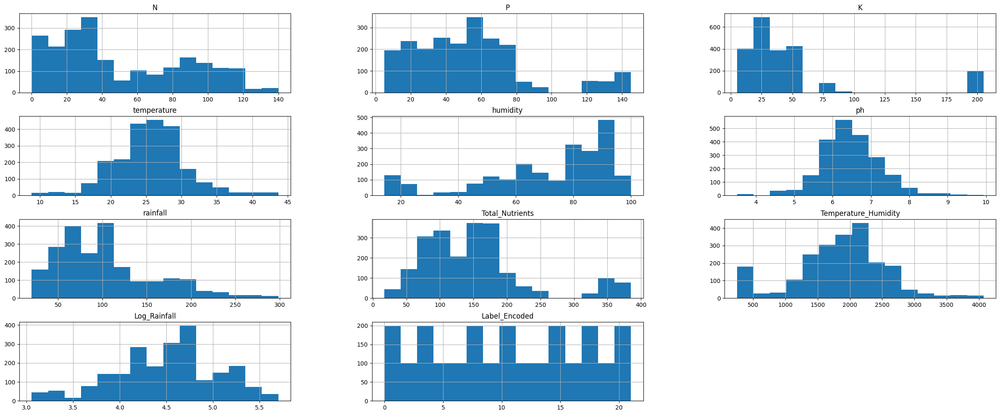

In [23]:
# Check the distribution of all the features
crop.hist(figsize=(30,12),bins = 15)
plt.title("Features Distribution")
plt.show()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 37.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 41.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 12.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 88.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 60.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 51.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 52.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 61.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.0/764.0 kB 47.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 97.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

Computing series-max-agg-39fe14bb8df3644911bd39a14dc1e8fa:   0%|          | 0/2196 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
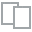
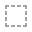
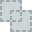
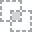
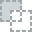
...
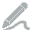
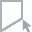
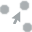
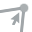
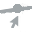

In [25]:
!pip install dataprep --quiet

from dataprep.datasets import load_dataset
from dataprep.eda import create_report

create_report(crop)

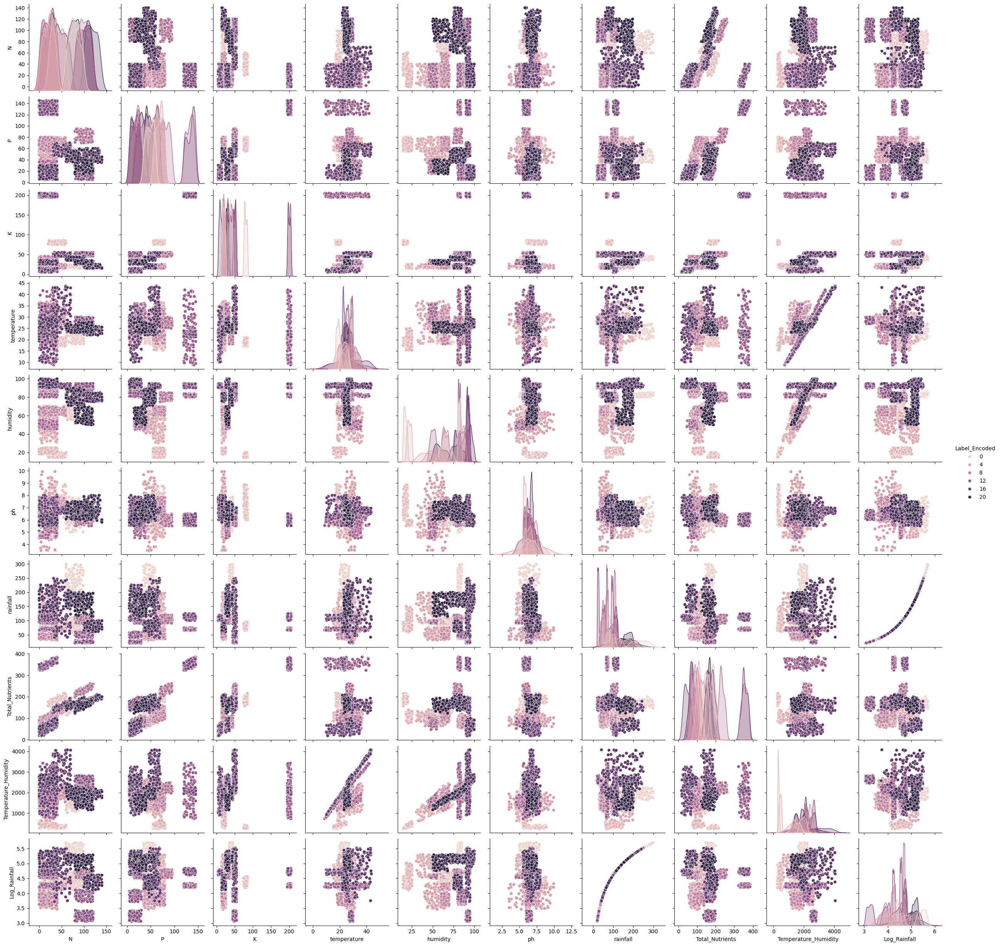

In [26]:
sns.pairplot(crop,hue = 'Label_Encoded')

**Feature Selection**

In [27]:
crop = crop.drop(columns=['Total_Nutrients', 'Log_Rainfall'])

In [28]:
crop.shape

(2200, 9)

In [29]:
crop['Label_Encoded'].value_counts()

Label_Encoded
0     100
1     100
20    100
19    100
18    100
17    100
16    100
15    100
14    100
13    100
12    100
11    100
10    100
9     100
8     100
7     100
6     100
5     100
4     100
3     100
2     100
21    100
Name: count, dtype: int64

**Train Test Split**

In [30]:
# Split the dataset into features and labels
X = crop.iloc[:, :-1]
y = crop.iloc[:, -1]

In [31]:
from sklearn.model_selection import train_test_split
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

**Scale the features using MinMaxScaler**

In [32]:
from sklearn.preprocessing import MinMaxScaler

def scale_data(X_train, X_test, scaler):
    # Fit the scaler on training data and transform training data
    X_train_scaled = scaler.fit_transform(X_train)

    # Transform testing data using the fitted scaler
    X_test_scaled = scaler.transform(X_test)

    return X_train_scaled, X_test_scaled

In [33]:
# Create a MinMaxScaler
scaler = MinMaxScaler()

# Scale the data using the scale_data function
X_train_scaled, X_test_scaled = scale_data(X_train, X_test, scaler)

**Training Models**

In [34]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report

# create instances of all models
models = {
    'Logistic Regression': LogisticRegression(),
    'Support Vector Machine': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'Random Forest': RandomForestClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'Extra Trees': ExtraTreeClassifier(),
    'XGBoost':XGBClassifier(),
}

from sklearn.metrics import accuracy_score
for name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    acc = accuracy_score(y_test, y_pred)
    print(f'{name}:\nAccuracy: {acc:.4f}')


Logistic Regression:
Accuracy: 0.9394
Support Vector Machine:
Accuracy: 0.9788
K-Nearest Neighbors:
Accuracy: 0.9833
Decision Tree:
Accuracy: 0.9742
Random Forest:
Accuracy: 0.9970
AdaBoost:
Accuracy: 0.1818
Gradient Boosting:
Accuracy: 0.9864
Extra Trees:
Accuracy: 0.8955
XGBoost:
Accuracy: 0.9864


**Model Evaluaton:**

In [35]:
from sklearn.metrics import accuracy_score

# Dictionary to store accuracies
test_accuracies = {}
train_accuracies = {}

# Iterate over models dictionary
for name, model in models.items():
    # Fit the model
    model.fit(X_train_scaled, y_train)

    # Calculate train accuracy
    train_pred = model.predict(X_train_scaled)
    train_acc = accuracy_score(y_train, train_pred)
    train_accuracies[name] = train_acc

    # Calculate test accuracy
    test_pred = model.predict(X_test_scaled)
    test_acc = accuracy_score(y_test, test_pred)
    test_accuracies[name] = test_acc

    # Generate classification report
    report = classification_report(y_test, test_pred)

    # Print the classification report
    print(f"Classification Report for {name}:")
    print(report)
    print("\n")

Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.73      0.90      0.81        30
           1       1.00      0.93      0.97        30
           2       1.00      1.00      1.00        30
           3       0.94      1.00      0.97        30
           4       1.00      0.93      0.97        30
           5       1.00      0.70      0.82        30
           6       0.94      1.00      0.97        30
           7       0.84      0.87      0.85        30
           8       0.88      0.93      0.90        30
           9       1.00      1.00      1.00        30
          10       0.97      1.00      0.98        30
          11       0.83      1.00      0.91        30
          12       1.00      1.00      1.00        30
          13       1.00      0.97      0.98        30
          14       0.94      1.00      0.97        30
          15       1.00      1.00      1.00        30
          16       1.00      0.90 

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Classification Report for AdaBoost:
              precision    recall  f1-score   support

           0       0.06      1.00      0.11        30
           1       0.00      0.00      0.00        30
           2       0.50      1.00      0.67        30
           3       0.00      0.00      0.00        30
           4       0.00      0.00      0.00        30
           5       0.00      0.00      0.00        30
           6       0.00      0.00      0.00        30
           7       0.00      0.00      0.00        30
           8       0.00      0.00      0.00        30
           9       0.00      0.00      0.00        30
          10       0.00      0.00      0.00        30
          11       0.00      0.00      0.00        30
          12       0.50      1.00      0.67        30
          13       0.00      0.00      0.00        30
          14       0.97      1.00      0.98        30
          15       0.00      0.00      0.00        30
          16       0.00      0.00      0.00  

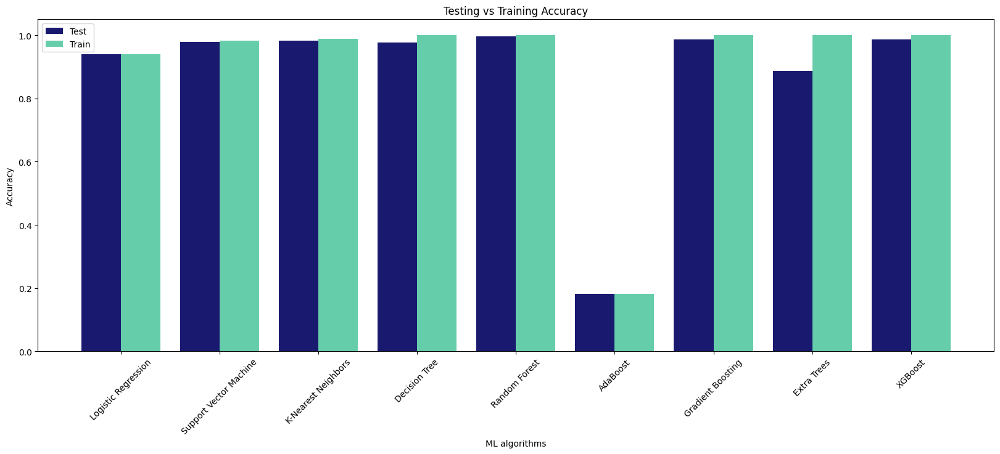

In [36]:
# Define labels for classifiers
label = ['Logistic Regression', 'Support Vector Machine', 'K-Nearest Neighbors', 'Decision Tree', 'Random Forest', 'AdaBoost', 'Gradient Boosting', 'Extra Trees', 'XGBoost']

# Get test and train accuracies from dictionaries
Test = [test_accuracies[name] for name in label]
Train = [train_accuracies[name] for name in label]

# Plotting
f, ax = plt.subplots(figsize=(20,7)) # Set the size of the plot
X_axis = np.arange(len(label))
plt.bar(X_axis - 0.2, Test, 0.4, label='Test', color='midnightblue')
plt.bar(X_axis + 0.2, Train, 0.4, label='Train', color='mediumaquamarine')

plt.xticks(X_axis, label, rotation=45) # Rotate labels for better readability
plt.xlabel("ML algorithms")
plt.ylabel("Accuracy")
plt.title("Testing vs Training Accuracy")
plt.legend()
plt.show()


In [37]:
# Find the index of the classifier with the highest test accuracy
best_classifier_index = np.argmax(Test)

# Get the name of the best classifier
best_classifier_name = label[best_classifier_index]

# Get the test accuracy of the best classifier
best_classifier_test_accuracy = Test[best_classifier_index]

# Print the best classifier and its test accuracy
print(f"The best classifier is {best_classifier_name} with a test accuracy of {best_classifier_test_accuracy:.4f}.")

The best classifier is Random Forest with a test accuracy of 0.9970.


In [38]:
# Best Model
rdf = RandomForestClassifier()
rdf.fit(X_train_scaled,y_train)
y_pred = rdf.predict(X_test_scaled)
print(accuracy_score(y_test,y_pred))

0.996969696969697


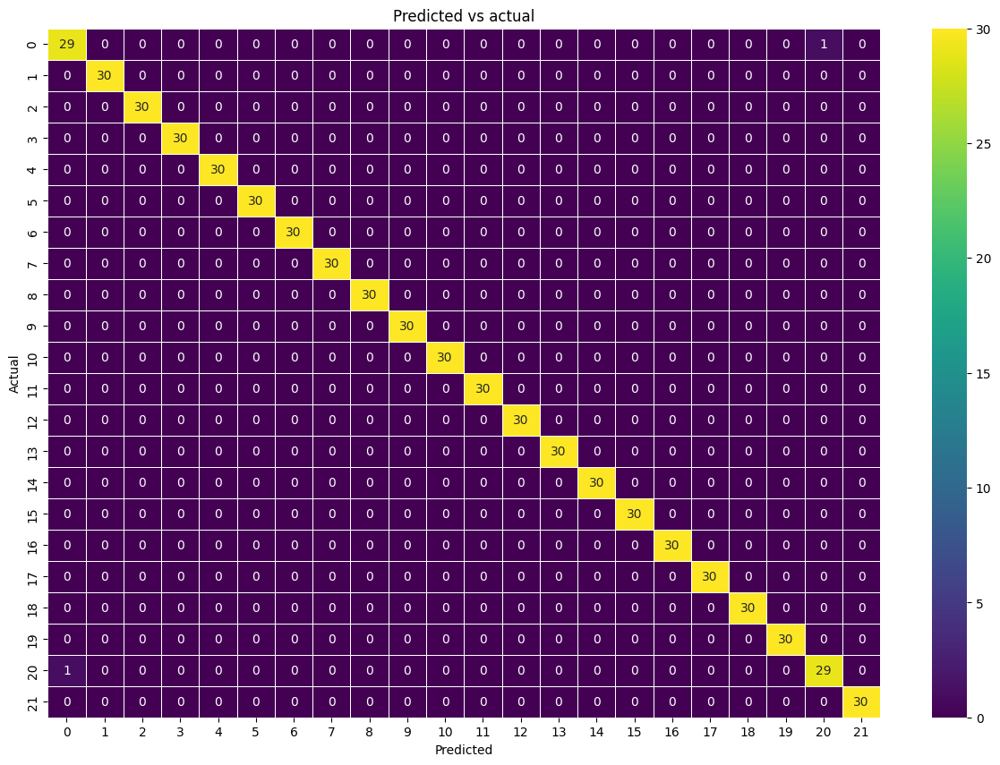

In [39]:
y_pred = rdf.predict(X_test_scaled)
y_true = y_test

from sklearn.metrics import confusion_matrix

cm_rf = confusion_matrix(y_true,y_pred)

f, ax = plt.subplots(figsize=(15,10))
sns.heatmap(cm_rf, annot=True, linewidth=0.5, fmt=".0f",  cmap='viridis', ax = ax)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title('Predicted vs actual')
plt.show()

**Predictive System**

In [40]:
import joblib

In [41]:
# Save the trained model to a joblib file
joblib.dump(rdf, 'random_forest_model.joblib')

['random_forest_model.joblib']

In [42]:
# Load the trained model from the joblib file
loaded_model = joblib.load('random_forest_model.joblib')

In [43]:
# Define function to make predictions

# Scale the input values using the same scaler
def scale_input_values(N, P, K, temperature, humidity, ph, rainfall,temperature_humidity, scaler):
    scaled_input_values = scaler.transform([[N, P, K, temperature, humidity, ph, rainfall, temperature_humidity]])
    return scaled_input_values

# Define function to make predictions
def predict_crop(N, P, K, temperature, humidity, ph, rainfall, temperature_humidity):
    # Scale the input values
    scaled_input_values = scale_input_values(N, P, K, temperature, humidity, pH, rainfall,temperature_humidity, scaler)

    # Use the model to make predictions
    prediction = loaded_model.predict(scaled_input_values)
    # Use the model to predict probabilities
    predicted_probabilities = loaded_model.predict_proba(scaled_input_values)[0]
    # Return the predicted crop label
    return prediction[0]

In [44]:
crop_dict = {
    0: 'wheat',
    1: 'barley',
    2: 'lettuce',
    3: 'spinach',
    4: 'cauliflower',
    5: 'brussels_sprouts',
    6: 'cabbage',
    7: 'beans',
    8: 'peas',
    9: 'turnips',
    10: 'carrots',
    11: 'beets',
    12: 'cherries',
    13: 'plums',
    14: 'raspberries',
    15: 'pears',
    16: 'blackcurrants',
    17: 'strawberries',
    18: 'apples',
    19: 'potatoes',
    20: 'rapeseed',
    21: 'tomatoes'
}

# Define function to make predictions
def predict_top_three_crops(N, P, K, temperature, humidity, ph, rainfall, temperature_humidity):
    # Scale the input values
    scaled_input_values = scale_input_values(N, P, K, temperature, humidity, ph, rainfall, temperature_humidity, scaler)

    # Use the model to predict probabilities
    predicted_probabilities = loaded_model.predict_proba(scaled_input_values)[0]

    # Combine crop index with its probability
    crop_probabilities = list(zip(range(len(predicted_probabilities)), predicted_probabilities))

    # Sort crops based on probability
    sorted_crops = sorted(crop_probabilities, key=lambda x: x[1], reverse=True)

    # Get top three crops
    top_three_crops = sorted_crops[:3]

    # Map crop index to crop name
    top_three_crops_with_names = [(crop_dict[crop_index], probability) for crop_index, probability in top_three_crops]

    return top_three_crops_with_names


In [45]:
#### Taking input values for crop prediction parameters

# Function to take input with error handling
def take_input(prompt, data_type):
    while True:
        try:
            value = data_type(input(prompt))
            return value
        except ValueError:
            print("Invalid input. Please enter a valid value.")

# Taking input values for each parameter
N = take_input("Enter the value of N (Nitrogen content in soil): ", float)
P = take_input("Enter the value of P (Phosphorus content in soil): ", float)
K = take_input("Enter the value of K (Potassium content in soil): ", float)
temperature = take_input("Enter the temperature (in Celsius): ", float)
humidity = take_input("Enter the humidity (in percentage): ", float)
pH = take_input("Enter the pH value of soil: ", float)
rainfall = take_input("Enter the rainfall (in mm): ", float)
temperature_humidity = take_input("Enter the temperature-humidity index: ", float)
print("\n")

top_three_crops = predict_top_three_crops(N, P, K, temperature, humidity, pH, rainfall, temperature_humidity)

# Print the recommended crops
print("The Top Three Recommended Crops Based On The provided Envirentmental Conditons are:")
for crop_name, probability in top_three_crops:
    print(f"{crop_name}: Probability = {probability:.2f}")


Enter the value of N (Nitrogen content in soil): 62
Enter the value of P (Phosphorus content in soil): 59
Enter the value of K (Potassium content in soil): 41
Enter the temperature (in Celsius): 24
Enter the humidity (in percentage): 74
Enter the pH value of soil: 7
Enter the rainfall (in mm): 192
Enter the temperature-humidity index: 1814


The Top Three Recommended Crops Based On The provided Envirentmental Conditons are:
rapeseed: Probability = 0.94
wheat: Probability = 0.05
barley: Probability = 0.01


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(
